# Conda Environment Setup Steps

**Important:** IceVision currently only supports Linux/macOS. Try using [WSL](https://docs.microsoft.com/en-us/windows/wsl/install) (Windows Subsystem for Linux) if training locally on Windows.

You might need to install the CUDA Toolkit on your system if you plan to run the training code locally. CUDA requires an Nvidia GPU. Version 11.1.0 of the toolkit is available at the link below. Both Google Colab and Kaggle Notebooks already have CUDA installed.

* [CUDA Toolkit 11.1.0](https://developer.nvidia.com/cuda-11.1.0-download-archive)
* [CUDA Toolkit Archive](https://developer.nvidia.com/cuda-toolkit-archive)

```bash
conda create --name icevision python==3.8
conda activate icevision
pip install torch==1.10.0+cu111 torchvision==0.11.1+cu111 -f https://download.pytorch.org/whl/torch_stable.html
pip install mmcv-full==1.3.17 -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
pip install mmdet==2.17.0
pip install icevision==0.11.0
pip install icedata==0.5.1
pip install setuptools==59.5.0
pip install jupyter
pip install onnxruntime
```

**Import IceVision library**

In [1]:
# Import all the necessary modules from the icevision package
from icevision.all import *

INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /home/innom-dt/.icevision/mmdetection_configs/mmdetection_configs-2.16.0/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:17


**Import and configure Pandas**

In [2]:
# Import the pandas package
import pandas as pd

# Set the max column width to None
pd.set_option('max_colwidth', None)

# Set the max number of rows and columns to None
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

**Clone dataset repository**

In [3]:
# Clone the dataset repository from GitHub
!git clone https://github.com/MbassiJaphet/pytorch-for-information-extraction.git

fatal: destination path 'pytorch-for-information-extraction' already exists and is not an empty directory.


**Define path to dataset**

In [4]:
# Set the path to the dataset directory
data_dir = Path('./pytorch-for-information-extraction/code/datasets/detection/student-id')
# Set the dataset name
dataset_name = data_dir.name

**Inspect dataset contents**

In [5]:
# Get a list of the files in the dataset directory and display them using a DataFrame
pd.DataFrame(list(data_dir.ls())).head()

,0
0,pytorch-for-information-extraction/code/datasets/detection/student-id/10001.jpg
1,pytorch-for-information-extraction/code/datasets/detection/student-id/10001.json
2,pytorch-for-information-extraction/code/datasets/detection/student-id/10002.jpg
3,pytorch-for-information-extraction/code/datasets/detection/student-id/10002.json
4,pytorch-for-information-extraction/code/datasets/detection/student-id/10003.jpg


**Get image file paths**

In [6]:
# Get the file paths for all the images in the dataset
files = get_image_files(data_dir)
# Count the number of files
len(files)

150

**Inspect one of the training images**

Image Dims: (480, 640)


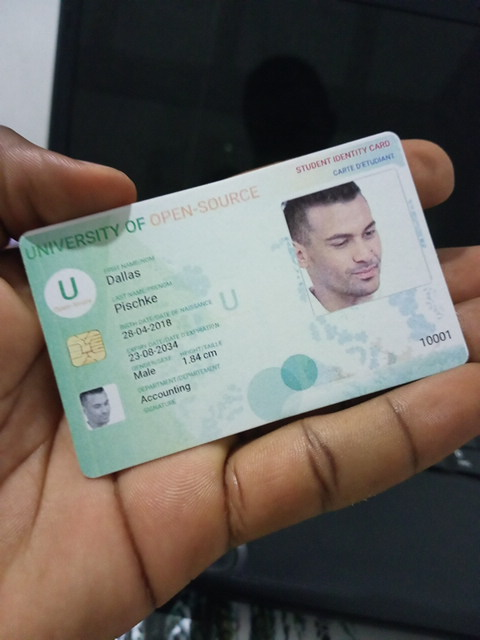

In [7]:
# Import the PIL package
import PIL

# Open the first image in the dataset
img = PIL.Image.open(files[0]).convert('RGB')

# Print the dimensions of the image
print(f"Image Dims: {img.size}")

# Display the image
img

**Create a dictionary that maps image names to file paths**

In [8]:
# Create a dictionary that maps image names to file paths
img_dict = {file.name.split('.')[0] : file for file in files}

# Display the first item in the dictionary as a DataFrame
pd.DataFrame(list(img_dict.items())[0]).transpose()

,0,1
0,10001,pytorch-for-information-extraction/code/datasets/detection/student-id/10001.jpg


**Get list of annotation file paths**

In [9]:
# Import the os and glob modules
import os
from glob import glob

In [10]:
# Get a list of the annotation file paths in the dataset directory
annotation_paths = glob(os.path.join(data_dir, "*.json"))

# Display the list of annotation file paths as a DataFrame
pd.DataFrame(annotation_paths).head()

,0
0,pytorch-for-information-extraction/code/datasets/detection/student-id/10001.json
1,pytorch-for-information-extraction/code/datasets/detection/student-id/10002.json
2,pytorch-for-information-extraction/code/datasets/detection/student-id/10003.json
3,pytorch-for-information-extraction/code/datasets/detection/student-id/10004.json
4,pytorch-for-information-extraction/code/datasets/detection/student-id/10005.json


**Create annotation dataframe**

In [11]:
# Read the JSON files using Pandas and concatenate the resulting dataframes
# into a single dataframe
cls_dataframes = (pd.read_json(f, orient='index').transpose() for f in annotation_paths)
annotation_df = pd.concat(cls_dataframes, ignore_index=False)

# Assign the image file name as the index for each row
annotation_df['index'] = annotation_df.apply(lambda row: row['imagePath'].split('.')[0], axis=1)
annotation_df = annotation_df.set_index('index')

# Keep only the rows that have corresponding image files
annotation_df = annotation_df.loc[list(img_dict.keys())]

# View the first few rows of the dataframe
annotation_df.head()

,version,flags,shapes,lineColor,fillColor,imagePath,imageData,imageHeight,imageWidth
index,,,,,,,,,
10001,3.21.1,{},"[{'label': 'student_id', 'line_color': None, 'fill_color': None, 'points': [[19.190476190476204, 244.76190476190476], [23.0, 233.33333333333331], [385.8571428571428, 132.38095238095238], [400.1428571428571, 135.23809523809524], [468.71428571428567, 353.3333333333333], [466.80952380952374, 362.85714285714283], [97.28571428571428, 478.0952380952381], [81.09523809523807, 474.2857142857143]], 'shape_type': 'polygon', 'flags': {}}]","[0, 255, 0, 128]","[255, 0, 0, 128]",10001.jpg,,640,480
10002,3.21.1,{},"[{'label': 'student_id', 'line_color': None, 'fill_color': None, 'points': [[21.095238095238102, 183.33333333333334], [231.41269841269843, 88.09523809523809], [450.46031746031747, 347.6190476190476], [475.06349206349205, 376.1904761904762], [478.2380952380952, 388.8888888888889], [301.25396825396825, 532.5396825396825], [271.0952380952381, 556.3492063492064], [255.22222222222223, 541.2698412698413], [242.52380952380952, 534.9206349206349], [25.85714285714286, 199.20634920634922]], 'shape_type': 'polygon', 'flags': {}}]","[0, 255, 0, 128]","[255, 0, 0, 128]",10002.jpg,,640,480
10003,3.21.1,{},"[{'label': 'student_id', 'line_color': None, 'fill_color': None, 'points': [[138.23809523809524, 71.42857142857143], [407.7619047619047, 31.428571428571427], [418.2380952380952, 39.047619047619044], [422.04761904761904, 539.047619047619], [407.7619047619047, 552.3809523809524], [112.52380952380952, 519.047619047619], [98.23809523809524, 505.71428571428567]], 'shape_type': 'polygon', 'flags': {}}]","[0, 255, 0, 128]","[255, 0, 0, 128]",10003.jpg,,640,480
10004,3.21.1,{},"[{'label': 'student_id', 'line_color': None, 'fill_color': None, 'points': [[119.20529801324503, 218.54304635761588], [440.3973509933775, 184.7682119205298], [445.0331125827814, 190.72847682119206], [391.3907284768212, 366.2251655629139], [384.7682119205298, 372.18543046357615], [250.33112582781456, 401.3245033112583], [82.11920529801324, 446.3576158940397], [76.82119205298014, 441.72185430463577], [49.66887417218544, 239.73509933774835], [107.28476821192052, 228.47682119205297]], 'shape_type': 'polygon', 'flags': {}}]","[0, 255, 0, 128]","[255, 0, 0, 128]",10004.jpg,,640,480
10005,3.21.1,{},"[{'label': 'student_id', 'line_color': None, 'fill_color': None, 'points': [[41.18840579710144, 218.8405797101449], [41.18840579710144, 209.42028985507244], [52.78260869565216, 201.44927536231882], [224.52173913043475, 142.75362318840578], [359.30434782608694, 89.85507246376811], [367.99999999999994, 92.02898550724638], [462.2028985507246, 275.3623188405797], [369.4492753623188, 348.5507246376811], [199.88405797101444, 472.463768115942], [191.91304347826082, 471.01449275362313]], 'shape_type': 'polygon', 'flags': {}}]","[0, 255, 0, 128]","[255, 0, 0, 128]",10005.jpg,,640,480


**Inspect annotation data for sample image**

In [12]:
# Set the file ID for the image we want to inspect
file_id = files[56].name.split('.')[0]

# Print the file ID
file_id

'10057'

In [13]:
# Get the annotation data for the specified image file
annotation_df.loc[file_id].to_frame()

,10057
version,3.21.1
flags,{}
shapes,"[{'label': 'student_id', 'line_color': None, 'fill_color': None, 'points': [[4.703296703296701, 186.8131868131868], [172.28571428571428, 91.20879120879121], [177.23076923076923, 89.56043956043956], [183.82417582417582, 92.85714285714285], [260.19780219780216, 161.53846153846152], [248.65934065934067, 173.07692307692307], [99.75824175824175, 273.6263736263736], [88.2197802197802, 280.7692307692308], [83.27472527472527, 280.7692307692308], [35.472527472527474, 225.82417582417582]], 'shape_type': 'polygon', 'flags': {}}, {'label': 'student_id', 'line_color': None, 'fill_color': None, 'points': [[245.36263736263737, 134.06593406593407], [346.46153846153845, 100.0], [352.5054945054945, 101.64835164835165], [465.1428571428571, 248.9010989010989], [461.8461538461538, 252.1978021978022], [356.35164835164835, 300.5494505494505], [350.3076923076923, 297.8021978021978]], 'shape_type': 'polygon', 'flags': {}}, {'label': 'student_id', 'line_color': None, 'fill_color': None, 'points': [[33.27472527472527, 489.010989010989], [159.64835164835165, 281.3186813186813], [166.7912087912088, 271.97802197802196], [172.28571428571428, 270.3296703296703], [297.010989010989, 330.2197802197802], [300.3076923076923, 335.16483516483515], [299.2087912087912, 340.65934065934067], [223.38461538461536, 506.5934065934066], [192.6153846153846, 571.4285714285714], [184.9230769230769, 574.1758241758241], [172.28571428571428, 569.2307692307692], [47.56043956043956, 501.0989010989011], [36.021978021978015, 496.15384615384613]], 'shape_type': 'polygon', 'flags': {}}]"
lineColor,"[0, 255, 0, 128]"
fillColor,"[255, 0, 0, 128]"
imagePath,10057.jpg
imageData,
imageHeight,640
imageWidth,480


**Download font file**

In [14]:
# Set the font file name
font_file = 'KFOlCnqEu92Fr1MmEU9vAw.ttf'

# If the font file doesn't exist, download it
if not os.path.exists(font_file): 
    !wget https://fonts.gstatic.com/s/roboto/v30/$font_file

**Annotate sample image**

In [15]:
# Import the ImageDraw class from the PIL package
from PIL import ImageDraw

(480, 640)


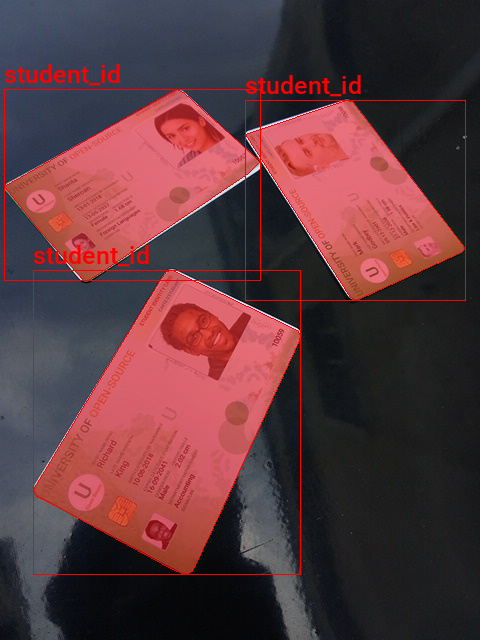

In [16]:
# Open the image file
img = PIL.Image.open(img_dict[file_id]).convert('RGB')

# Get the dimensions of the image
width, height = img.size

# Create a copy of the image to annotate
annotated_img = img.copy()

# Create a blank image to store the mask
mask_img = PIL.Image.new('L', img.size, 0)

# Create a drawing object for the annotated image
draw = ImageDraw.Draw(annotated_img)

# Set the font size for the object labels
fnt_size = 25

# Get the annotation data for the specified image
annotation = annotation_df.loc[file_id]

# Iterate through annotations for sample image
for i in range(len(annotation['shapes'])):
    
    # Extract mask polygon coords
    points = np.array(annotation['shapes'][i]['points'])
    
    # Extract bounding box coords
    x_min, y_min = points.min(axis=0)
    x_max, y_max = points.max(axis=0)
    
    # Draw bounding box on sample image
    shape = (x_min, y_min, x_max, y_max)
    draw.rectangle(shape, outline='red')

    # Draw segmentation mask on sample image
    xy = [(p[0],p[1]) for p in points]
    ImageDraw.Draw(annotated_img, 'RGBA').polygon(xy, fill=(255, 0, 0, 125), outline ="red")
    
    # Draw segmentation mask on blank image
    ImageDraw.Draw(mask_img, 'L').polygon(xy, fill=(255))
    
    # Draw object label on sample image
    fnt = PIL.ImageFont.truetype(font_file, fnt_size)
    label = annotation['shapes'][i]['label']
    draw.multiline_text((x_min, y_min-fnt_size-5), f"{label}", font=fnt, fill='red')

# Print the dimensions of the annotated image
print(annotated_img.size)

# Show the annotated image
annotated_img

**Display segmentation mask**

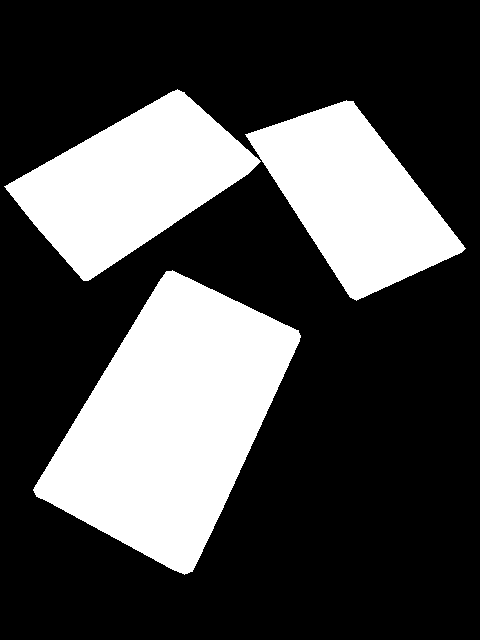

In [17]:
mask_img

**Create a class map**

In [18]:
# Explode the 'shapes' column in the annotation_df dataframe
# Convert the resulting series to a dataframe and rename the 'shapes' column to 'shapes'
# Apply the pandas Series function to the 'shapes' column of the dataframe
shapes_df = annotation_df['shapes'].explode().to_frame().shapes.apply(pd.Series)
# View the first few rows of the resulting dataframe
shapes_df.head()

,label,line_color,fill_color,points,shape_type,flags
index,,,,,,
10001,student_id,None,None,"[[19.190476190476204, 244.76190476190476], [23.0, 233.33333333333331], [385.8571428571428, 132.38095238095238], [400.1428571428571, 135.23809523809524], [468.71428571428567, 353.3333333333333], [466.80952380952374, 362.85714285714283], [97.28571428571428, 478.0952380952381], [81.09523809523807, 474.2857142857143]]",polygon,{}
10002,student_id,None,None,"[[21.095238095238102, 183.33333333333334], [231.41269841269843, 88.09523809523809], [450.46031746031747, 347.6190476190476], [475.06349206349205, 376.1904761904762], [478.2380952380952, 388.8888888888889], [301.25396825396825, 532.5396825396825], [271.0952380952381, 556.3492063492064], [255.22222222222223, 541.2698412698413], [242.52380952380952, 534.9206349206349], [25.85714285714286, 199.20634920634922]]",polygon,{}
10003,student_id,None,None,"[[138.23809523809524, 71.42857142857143], [407.7619047619047, 31.428571428571427], [418.2380952380952, 39.047619047619044], [422.04761904761904, 539.047619047619], [407.7619047619047, 552.3809523809524], [112.52380952380952, 519.047619047619], [98.23809523809524, 505.71428571428567]]",polygon,{}
10004,student_id,None,None,"[[119.20529801324503, 218.54304635761588], [440.3973509933775, 184.7682119205298], [445.0331125827814, 190.72847682119206], [391.3907284768212, 366.2251655629139], [384.7682119205298, 372.18543046357615], [250.33112582781456, 401.3245033112583], [82.11920529801324, 446.3576158940397], [76.82119205298014, 441.72185430463577], [49.66887417218544, 239.73509933774835], [107.28476821192052, 228.47682119205297]]",polygon,{}
10005,student_id,None,None,"[[41.18840579710144, 218.8405797101449], [41.18840579710144, 209.42028985507244], [52.78260869565216, 201.44927536231882], [224.52173913043475, 142.75362318840578], [359.30434782608694, 89.85507246376811], [367.99999999999994, 92.02898550724638], [462.2028985507246, 275.3623188405797], [369.4492753623188, 348.5507246376811], [199.88405797101444, 472.463768115942], [191.91304347826082, 471.01449275362313]]",polygon,{}


In [19]:
# Create a list of unique labels from the 'label' column of the shapes_df dataframe
labels = shapes_df['label'].unique().tolist()
# Print the list of labels
labels

['student_id']

In [20]:
# Create a ClassMap object with the list of labels
class_map = ClassMap(labels)
# Print the ClassMap object
class_map

<ClassMap: {'background': 0, 'student_id': 1}>

**View template for an instance segmentation record**

In [21]:
# Create an InstanceSegmentationRecord object
template_record = InstanceSegmentationRecord()
# Print the InstanceSegmentationRecord object
template_record

BaseRecord

common: 
	- Image size None
	- Record ID: None
	- Filepath: None
	- Img: None
detection: 
	- masks: []
	- mask_array: None
	- BBoxes: []
	- Class Map: None
	- Labels: []

**View template for an instance segmentation parser**

In [22]:
# Generate a template record for an instance segmentation dataset using the InstanceSegmentationRecord object
Parser.generate_template(template_record)

class MyParser(Parser):
    def __init__(self, template_record):
        super().__init__(template_record=template_record)
    def __iter__(self) -> Any:
    def __len__(self) -> int:
    def record_id(self, o: Any) -> Hashable:
    def parse_fields(self, o: Any, record: BaseRecord, is_new: bool):
        record.set_img_size(<ImgSize>)
        record.set_filepath(<Union[str, Path]>)
        record.detection.add_masks(<Sequence[Mask]>)
        record.detection.add_bboxes(<Sequence[BBox]>)
        record.detection.set_class_map(<ClassMap>)
        record.detection.add_labels(<Sequence[Hashable]>)


**Define custom parser class**

In [23]:
class StudentIDParser(Parser):
    # Initialize a StudentIDParser object
    def __init__(self, template_record, annotations_df, img_dict, class_map):
        # Call the __init__ method of the parent class
        super().__init__(template_record=template_record)
        
        # Set the instance variables to the values of the corresponding arguments
        self.img_dict = img_dict
        self.df = annotations_df
        self.class_map = class_map

    # Return an iterator over the rows of the DataFrame
    def __iter__(self):
        for o in self.df.itertuples(): yield o

    # Return the number of rows in the DataFrame
    def __len__(self):
        return len(self.df)

    # Return the index of the current row of the DataFrame
    def record_id(self, o: Any) -> Hashable:
        return o.Index

    # Return the image width and height
    def image_width_height(self, o) -> Tuple[int, int]:
        return self._size[:2]

    # Parse the data from the DataFrame and populate the record object
    def parse_fields(self, o, record, is_new):
        
        # Get the file path of the image from the img_dict dictionary
        filepath = self.img_dict[o.Index]
        
        # Open the image and get its width and height
        width, height = PIL.Image.open(filepath).convert('RGB').size
        
        # Set the image size and file path of the record object
        record.set_img_size([width, height])
        record.set_filepath(Path(filepath))
        
        # Set the class map of the record object's detection attribute
        record.detection.set_class_map(self.class_map)
                
        # Initialize empty lists for labels, bounding boxes, and masks
        labels = []
        bbox_list = []
        mask_list = []
        
        # Iterate over the shapes in the current row of the DataFrame
        for i in range(len(o.shapes)):
            # Get the points of the shape
            points = np.array(o.shapes[i]['points'])

            # Calculate the minimum and maximum x- and y-coordinates of the points
            x_min, y_min = points.min(axis=0)
            x_max, y_max = points.max(axis=0)
            
            # Add the label to the labels list
            labels.append(o.shapes[i]['label'])
            
            # Create a bounding box object from the coordinates and add it to the bbox_list
            bbox_list.append(BBox.from_xyxy(x_min, y_min, x_max, y_max))
            
            # Create a mask image and draw the shape on it
            mask_img = PIL.Image.new('L', (width, height), 0)
            xy = [(p[0],p[1]) for p in points]
            ImageDraw.Draw(mask_img, 'L').polygon(xy, fill=(1))
            # Convert the mask image to a numpy array and add it to the mask_list
            mask_array = np.array(mask_img).clip(0,1)
            mask_list.append(MaskArray(mask_array))
        
        # Add the labels, bounding boxes, and masks to the record object
        record.detection.add_labels(labels)
        record.detection.add_bboxes(bbox_list)
        record.detection.add_masks(mask_list)

**Create a custom parser object**

In [24]:
# Create a StudentIDParser object
parser = StudentIDParser(template_record, annotation_df, img_dict, class_map)

# Return the length of the parser object, which is the number of rows in the DataFrame
len(parser)

150

**Parse annotations to create records**

In [25]:
# Create a RandomSplitter object
data_splitter = RandomSplitter([0.8, 0.2])

# Use the RandomSplitter to split the data into training and validation sets
train_records, valid_records = parser.parse(data_splitter)
# train_records, valid_records = parser.parse(data_splitter, cache_filepath=f'{dataset_name}-cache.pkl')

  0%|          | 0/150 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/150 [00:00<?, ?it/s]

**Export class labels**

In [26]:
# Import the json module
import json

# Create a dictionary containing the class labels
class_labels = {"classes": parser.class_map.get_classes()}

# Generate a file name for the class labels file
class_labels_file_name = f"{data_dir.name}-classes.json"

# Open the class labels file for writing and write the class labels to it
with open(class_labels_file_name, "w") as write_file:
    json.dump(class_labels, write_file)
    
# Return the class labels and file name
class_labels, class_labels_file_name

({'classes': ['background', 'student_id']}, 'student-id-classes.json')

**Inspect training records**

In [27]:
# Get the first element of the train_records object
train_records[0]

BaseRecord

common: 
	- Image size [1024, 768]
	- Record ID: 10076
	- Filepath: pytorch-for-information-extraction/code/datasets/detection/student-id/10076.jpg
	- Img: None
detection: 
	- masks: [<icevision.core.mask.MaskArray object at 0x7f190bd40a60>, <icevision.core.mask.MaskArray object at 0x7f190bd40be0>]
	- mask_array: None
	- BBoxes: [<BBox (xmin:106.2528735632184, ymin:85.35632183908046, xmax:472.9195402298851, ymax:639.3793103448276)>, <BBox (xmin:467.1724137931035, ymin:63.51724137931035, xmax:963.7241379310344, ymax:675.0114942528736)>]
	- Class Map: <ClassMap: {'background': 0, 'student_id': 1}>
	- Labels: [1, 1]

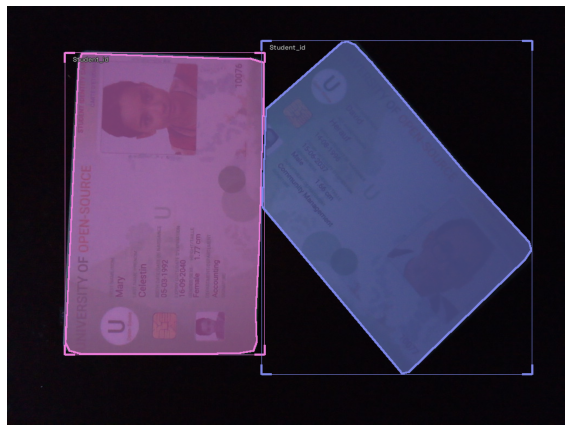

In [28]:
# Annotate the first sample of the train_records object
show_record(train_records[0], figsize = (10,10), display_label=True )

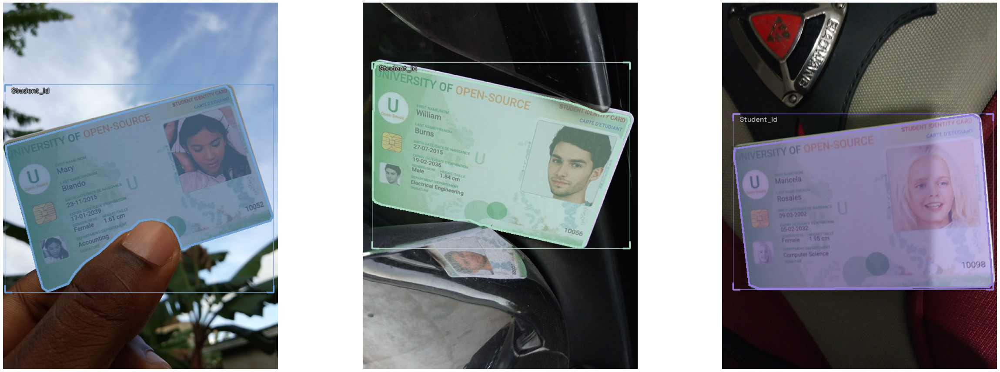

In [29]:
# Annotate the second to fourth samples of the train_records list
show_records(train_records[1:4], ncols=3,display_label=True)

**Define input resolution**

In [30]:
# Set the image size to 512
image_size = 512

# Set the presize to 1024
presize = 1024

**Define Transforms**

In [31]:
# Define the data transforms for the training and validation sets
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

**Get normalization stats**

In [32]:
# Get the mean of the Normalize() transformation
mean = tfms.A.Normalize().mean

# Get the standard deviation of the Normalize() transformation
std = tfms.A.Normalize().std

# Print the mean and standard deviation
mean, std

((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))

**Define Datasets**

In [33]:
# Create a Dataset object for the training set
train_ds = Dataset(train_records, train_tfms)

# Create a Dataset object for the validation set
valid_ds = Dataset(valid_records, valid_tfms)

# Return the Dataset objects
train_ds, valid_ds

(<Dataset with 120 items>, <Dataset with 30 items>)

**Apply augmentations to a training sample**

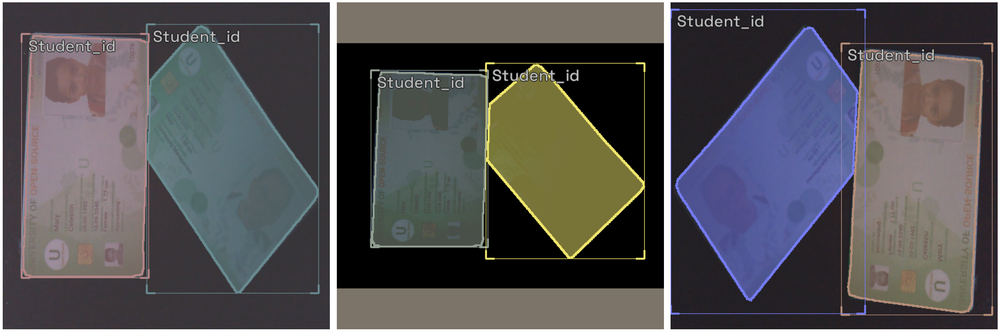

In [34]:
# Get three samples from the training set
samples = [train_ds[0] for _ in range(3)]

# Show the samples
show_samples(samples, ncols=3)

**Define model type**

In [35]:
# Set the model type to Mask R-CNN
model_type = models.torchvision.mask_rcnn

**Define backbone**

In [36]:
# Create a ResNet50-FPN backbone for the model
backbone = model_type.backbones.resnet50_fpn()

**Define batch size**

In [37]:
# Set the batch size
bs = 4

**Define DataLoaders**

In [38]:
# Create a DataLoader for the training set
train_dl = model_type.train_dl(train_ds, batch_size=bs, num_workers=2, shuffle=True)

# Create a DataLoader for the validation set
valid_dl = model_type.valid_dl(valid_ds, batch_size=bs, num_workers=2, shuffle=False)

In [39]:
# Get the first mini-batch from the validation set
valid_batch = first(valid_dl)

In [40]:
# Unpack the data from the first mini-batch of the validation set
(valid_images, valid_labels), valid_records = valid_batch

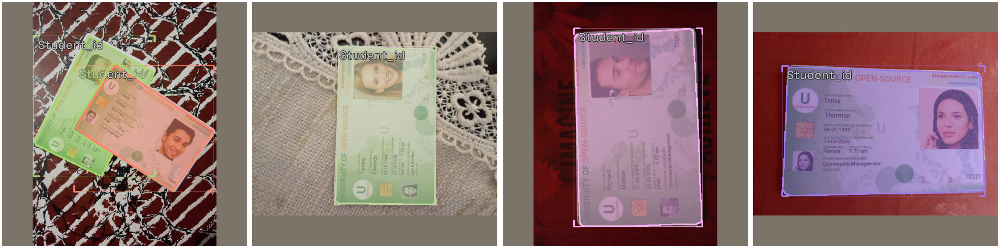

In [41]:
# Show a mini-batch of data from the validation set
model_type.show_batch(first(valid_dl), ncols=4)

**Instantiate the model**

In [42]:
# Create a Mask R-CNN model
model = model_type.model(backbone=backbone, num_classes=parser.class_map.num_classes)

**Define metrics**

In [43]:
# Define a list of metrics to evaluate the model
metrics = [COCOMetric(metric_type=COCOMetricType.mask)]

**Define Learner object**

In [44]:
# Create a fastai learner object to train and evaluate the Mask R-CNN model
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

**Find learning rate**

/home/innom-dt/mambaforge/envs/icevision/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


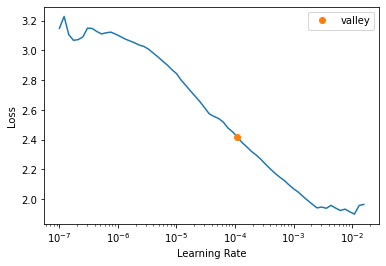

In [45]:
# Use the learning rate finder to find a good learning rate for the Mask R-CNN model
suggested_lrs = learn.lr_find()

**Define learning rate**

In [46]:
# Use the optimal learning rate identified by the learning rate finder
lr = suggested_lrs.valley*3
lr

0.00032894346804823726

**Define number of epochs**

In [47]:
# Set the number of epochs to train the Mask R-CNN model
epochs = 60

**Finetune model**

In [48]:
# Train the Mask R-CNN model
learn.fine_tune(epochs, lr, freeze_epochs=1)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.597090,1.091466,0.000000,00:05


epoch,train_loss,valid_loss,COCOMetric,time
0,1.169056,1.004704,0.000000,00:10
1,0.998358,0.656007,0.000000,00:09
2,0.783003,0.442801,0.000000,00:08
3,0.614551,0.382941,0.000000,00:08
4,0.512949,0.324999,0.000000,00:08
5,0.449891,0.301512,0.000000,00:08
6,0.395085,0.287797,0.000000,00:08
7,0.358589,0.261826,0.000000,00:08
8,0.359187,0.267066,0.000000,00:08
9,0.328885,0.237575,0.000000,00:08


**Show results on validation set**

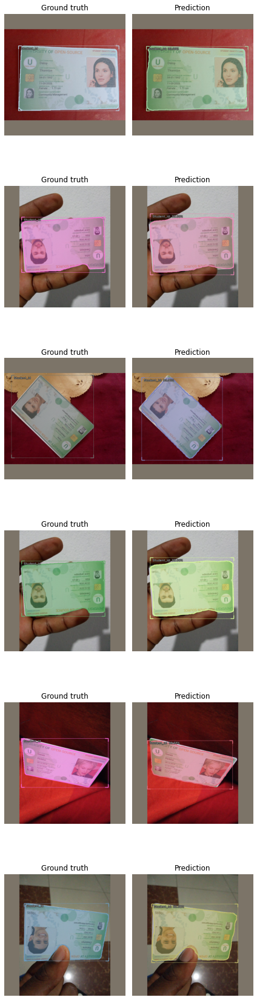

In [49]:
# Show the results of the predictions on the validation set
model_type.show_results(model, valid_ds, detection_threshold=.5)

**Define model checkpoint file path**

In [50]:
# Define a path to save the trained model
checkpoint_path = f"{data_dir.name}-{type(model).__name__}.pth"
checkpoint_path

'student-id-MaskRCNN.pth'

**Save model checkpoint**

In [51]:
# Save the trained model to the specified path
torch.save(model.state_dict(), checkpoint_path)

**Load class labels**

In [52]:
# Open the class labels file
with open(class_labels_file_name, "r") as read_file:
    # Load the class labels from the file
    classes = json.loads(read_file.read())

# Print the list of class labels
print(classes['classes'])

['background', 'student_id']


**Load model checkpoint**

In [53]:
# Load the model from the checkpoint file
checkpoint_and_model = models.model_from_checkpoint(
    # Path to the checkpoint file
    checkpoint_path, 
    # Name of the model class
    model_name='torchvision.mask_rcnn', 
    # Name of the backbone to use for the model
    backbone_name='resnet50_fpn',
    # Image size for the model
    img_size=512, 
    # List of class labels for the model
    classes=classes['classes'],
)

Use load_from_local loader


**Verify class map**

In [54]:
# View the class map for the model
checkpoint_and_model["class_map"]

<ClassMap: {'background': 0, 'student_id': 1}>

**Get model and device**

In [55]:
# Retrieve the trained model from the dictionary
model = checkpoint_and_model["model"]
# Retrieve the inference device from the dictionary
device=next(model.parameters()).device
device

device(type='cpu')

**Define inference preprocessing steps**

In [57]:
# Set the image size from the checkpoint dictionary
img_size = checkpoint_and_model["img_size"]

# Create the validation transforms: resize and pad to match img_size, normalize
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])

**Select a test image**

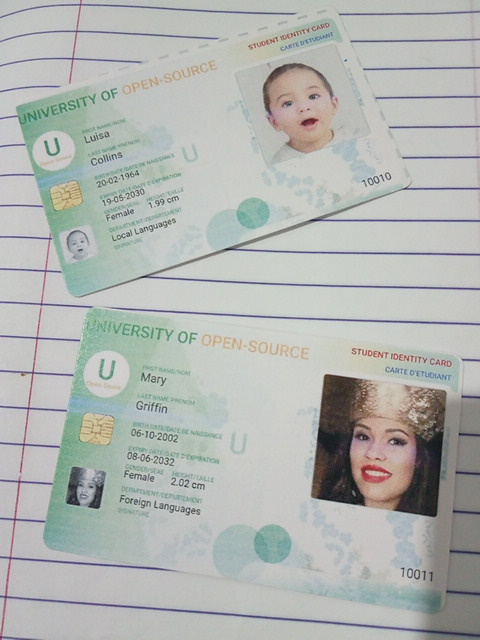

In [58]:
# Open the 10th file in the files list
test_img = open_img(files[9])
# Display the test image
test_img

**Define inference dataloader**

In [59]:
# Create the inference transforms: normalize
infer_tfms = tfms.A.Adapter([tfms.A.Normalize()])

# Create an inference dataset from the test image
infer_ds = Dataset.from_images([test_img], infer_tfms)

# Create a data loader for the inference dataset
infer_dl = model_type.infer_dl(infer_ds, batch_size=1, shuffle=False)

**Perform inference**

In [60]:
# Make predictions on the test image using the model
preds = model_type.predict_from_dl(model, infer_dl, keep_images=True)

  0%|          | 0/1 [00:00<?, ?it/s]

**Inspect source image**

In [61]:
# Access the ground truth information for the first prediction
preds[0].ground_truth

BaseRecord

common: 
	- Image size ImgSize(width=480, height=640)
	- Img: 480x640x3 <np.ndarray> Image
	- Record ID: 0
detection: 
	- Class Map: None

**Inspect model prediction**

In [62]:
# Access the predicted information for the first prediction
preds[0].pred

BaseRecord

common: 
	- Record ID: 0
	- Img: 480x640x3 <np.ndarray> Image
	- Image size ImgSize(width=480, height=640)
detection: 
	- Scores: [0.99980336 0.99969125]
	- BBoxes: [<BBox (xmin:35.02783203125, ymin:303.5675964355469, xmax:463.5101623535156, ymax:618.9385986328125)>, <BBox (xmin:3.624237060546875, ymin:4.456939697265625, xmax:409.2608642578125, ymax:308.0666809082031)>]
	- Class Map: None
	- Labels: [1, 1]
	- masks: []
	- mask_array: <icevision.core.mask.MaskArray object at 0x7f1801b0e5b0>

**Annotate image with model prediction**

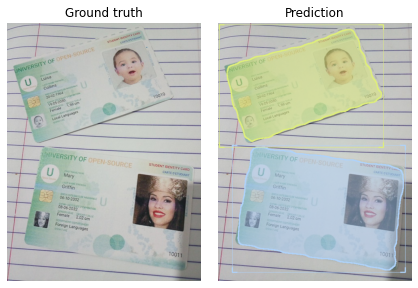

In [63]:
# Display the predictions for the test image
show_preds(preds=preds)

**Define method to convert a PIL Image to a Pytorch Tensor**

In [64]:
def img_to_tensor(img:PIL.Image, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """
    Converts a PIL image to a PyTorch tensor.
    
    Args:
        img: The input PIL image.
        mean: The mean values for normalization.
        std: The standard deviation values for normalization.
    
    Returns:
        The normalized tensor.
    """
    # Convert image to tensor
    img_tensor = torch.Tensor(np.array(img)).permute(2, 0, 1)
    # Scale pixels values from [0,255] to [0,1]
    scaled_tensor = img_tensor.float().div_(255)
    # Prepare normalization tensors
    mean_tensor = tensor(mean).view(1,1,-1).permute(2, 0, 1)
    std_tensor = tensor(std).view(1,1,-1).permute(2, 0, 1)
    # Normalize tensor    
    normalized_tensor = (scaled_tensor - mean_tensor) / std_tensor
    # Batch tensor
    return normalized_tensor.unsqueeze(dim=0)

**Convert image to a normalized tensor**

In [65]:
# Convert the test image to a tensor
input_tensor = img_to_tensor(test_img)

# Display the shape of the tensor
input_tensor.shape

torch.Size([1, 3, 640, 480])

**Inspect raw model output**

In [66]:
# Make predictions on the test image using the model
with torch.no_grad():
    preds = model(input_tensor)

# display the predictions
preds

[{'boxes': tensor([[ 35.0278, 303.5676, 463.5102, 618.9385],
          [  3.6243,   4.4569, 409.2609, 308.0667]]),
  'labels': tensor([1, 1]),
  'scores': tensor([0.9998, 0.9997]),
  'masks': tensor([[[[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
             0.0000e+00, 0.0000e+00],
            [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
             0.0000e+00, 0.0000e+00],
            [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
             0.0000e+00, 0.0000e+00],
            ...,
            [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
             0.0000e+00, 0.0000e+00],
            [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
             0.0000e+00, 0.0000e+00],
            [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
             0.0000e+00, 0.0000e+00]]],
  
  
          [[[1.0307e-06, 1.3463e-06, 1.6618e-06,  ..., 0.0000e+00,
             0.0000e+00, 0.0000e+00],
            [1.9822e-06, 2.5890e-06, 3.1958e-06,  

**Benckmark PyTorch CPU inference**

In [69]:
%%timeit
# Measure the time it takes to make predictions on the input tensor
with torch.no_grad(): model(input_tensor)

436 ms ± 3.99 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


**Define ONNX file name**

In [70]:
# Create a filename for the ONNX model
onnx_file_name = f"{dataset_name}-{type(model).__name__}.onnx"

# Display the filename
onnx_file_name

'student-id-MaskRCNN.onnx'

**Export trained model to ONNX**

In [71]:
# Export the PyTorch model to ONNX format
torch.onnx.export(model,
                  input_tensor,
                  onnx_file_name,
                  export_params=True,
                  opset_version=12,
                  do_constant_folding=True,
                  input_names = ['input'],
                  output_names = ['boxes', 'labels', 'scores', 'masks'],
                  dynamic_axes={'input': {2 : 'height', 3 : 'width'}}
                 )

/home/innom-dt/mambaforge/envs/icevision/lib/python3.8/site-packages/torchvision/models/detection/anchor_utils.py:122: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  strides = [[torch.tensor(image_size[0] // g[0], dtype=torch.int64, device=device),
/home/innom-dt/mambaforge/envs/icevision/lib/python3.8/site-packages/torchvision/models/detection/anchor_utils.py:122: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  strides = [[torch.tensor(image_size[0] // g[0], dtype=torch.int64, device=device),
/home/innom-dt/mamba

**Import ONNX Runtime**

In [72]:
# Import the onnxruntime library
import onnxruntime as ort

**Get available ONNX Runtime execution providers**

In [73]:
# Get the list of available providers for onnxruntime
available_providers = ort.get_available_providers()

# Display the available providers
available_providers

['CPUExecutionProvider']

**Select execution provider**

In [74]:
# Use the first available provider for onnxruntime
providers = [available_providers[0]]

# Display the selected provider
providers

['CPUExecutionProvider']

**Initialize inference session with selected execution provider**

In [75]:
# Create an inference session for the ONNX model
ort_sess = ort.InferenceSession(onnx_file_name, providers=providers)

**Perform inference using ONNX model**

In [76]:
# Make predictions on the input tensor using the ONNX model
outputs = ort_sess.run(output_names=None, input_feed={"input":input_tensor.numpy()})

# Display the predictions
outputs

[array([[ 35.027817, 303.56763 , 463.51025 , 618.93854 ],
        [  3.624237,   4.456955, 409.26083 , 308.06665 ]], dtype=float32),
 array([1, 1], dtype=int64),
 array([0.99980336, 0.99969125], dtype=float32),
 array([[[[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
           0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
          [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
           0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
          [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
           0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
          ...,
          [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
           0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
          [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
           0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
          [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
           0.0000000e+00, 0.0000000e+00, 0.0000000e+00]]],
 
 
        [[[1.0316414e-06, 1.3474498e-06, 1.6632586e-06, ...,

**Benchmark ONNX Runtime CPU inference speed**

In [77]:
%%timeit
# Measure the time it takes to make predictions on the input tensor
ort_sess.run(None, {'input': input_tensor.numpy()})

329 ms ± 3.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


**Define annotation values**

In [78]:
# Set the mask threshold
mask_threshold = 0.5

# Set the mask color
mask_rgba = [255, 0, 0, 100]

**Annotate sample image**

(480, 640)


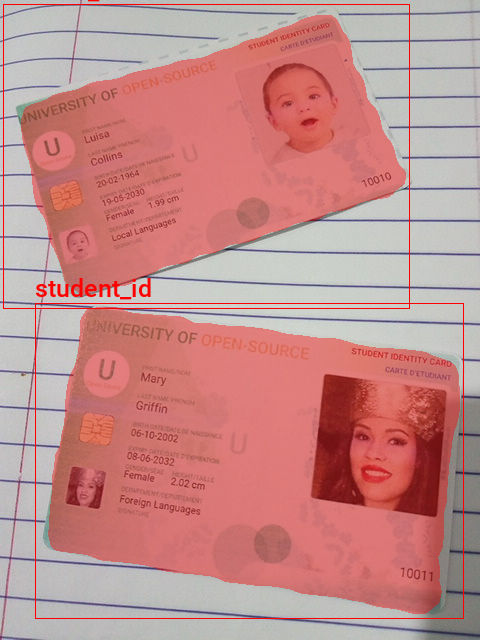

In [79]:
# Create a copy of the test image
annotated_img = test_img.copy()

# Convert the image to RGBA format
annotated_img.convert('RGBA')

# Create a drawing context for the image
draw = ImageDraw.Draw(annotated_img)

# Set the font size for the labels
fnt_size = 25

# Iterate through annotations for sample image
for i in range(len(outputs[0])):
    
    # Extract mask array
    mask_array = outputs[-1][i][0]
    # Binarize mask values
    mask_array[mask_array > mask_threshold] = 1.0
    mask_array[mask_array <= mask_threshold] = 0.0
    # Scale mask values
    mask_array *= 255
    # Convert mask from 1-channel to 4-channel
    mask_array = np.tile(mask_array[:, :, None], [1, 1, 4])
    # Update mask color
    mask_array[:,:,0][mask_array[:,:,0] == 255] = mask_rgba[0]
    mask_array[:,:,1][mask_array[:,:,1] == 255] = mask_rgba[1]
    mask_array[:,:,2][mask_array[:,:,2] == 255] = mask_rgba[2]
    # Update mask transparency
    mask_array[:,:,3][mask_array[:,:,0] == 255] = mask_rgba[3]
    mask_array[:,:,3][mask_array[:,:,1] == 255] = mask_rgba[3]
    mask_array[:,:,3][mask_array[:,:,2] == 255] = mask_rgba[3]
    mask_array[:,:,3][mask_array[:,:,0] != 255] = 0
    # Convert mask array to PIL image
    mask_img = PIL.Image.fromarray(mask_array.astype(np.uint8)).convert('RGBA')
    
    # Draw segmentation mask on sample image
    annotated_img.paste(mask_img, (0,0), mask=mask_img)
    
    # Draw bounding box on sample image
    shape = list(outputs[0][i])
    draw.rectangle(shape, outline='red')
    
    # Draw object label on sample image
    fnt = PIL.ImageFont.truetype(font_file, fnt_size)
    label = class_map.get_classes()[outputs[1][i]]
    draw.multiline_text((shape[0], shape[1]-fnt_size-5), f"{label}", font=fnt, fill='red')
    
# Print the size of the annotated image
print(annotated_img.size)

# Display the annotated image
annotated_img